In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.utils as vutils
import base64
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import random
import time
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision import transforms
from datetime import datetime
from io import BytesIO
from PIL import Image, ImageOps
from tqdm import tqdm
#import cv2
import numpy as np
from PIL import Image
import torchvision.transforms.functional as TF
import torch
import torch.nn as nn
import io
import os
import mlflow
import tempfile

from elucidated_diffusion.elucidated_diffusion import edm_ancestral_sampling_for_diffusion
from elucidated_diffusion.elucidated_diffusion import edm_ancestral_sampling_for_sr
from elucidated_diffusion.elucidated_diffusion import P_mean, P_std, sigma_data, edm_loss_weight
from elucidated_diffusion.ema_helper import EMAHelper
from elucidated_diffusion.models.claude_skip_attention import SkipAttentionUNet
# from elucidated_diffusion.models.claude_cascaded_vit import FlexibleCascadedViT # old version
#from elucidated_diffusion.models.claude_cascaded_vit import MultiScaleSharedViT # old version in pixel space
#from elucidated_diffusion.models.claude_cascaded_vit import SemanticCascadeViT
#from elucidated_diffusion.models.claude_cascaded_vit import MultiScaleSemanticViT
from elucidated_diffusion.models.claude_cascaded_vit import CoarseToFineViT

from elucidated_diffusion.models.claude_diffusion_ViTEnhancedUNet64 import create_vit_enhanced_unet
from elucidated_diffusion.models.claude_diffusion_ViTGradualTransition import create_gradual_transition_unet
from elucidated_diffusion.models.claude_diffusion_ViTGradualTransition import create_gradual_transition_unet
from elucidated_diffusion.models.claude_SemanticCoordinatorViTUNet import create_semantic_coordinator
from elucidated_diffusion.checkpoint_helper import load_checkpoint, save_checkpoint, show_model_info

device='cpu'

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
HR = 256
LR = 64
device='cpu'
device

'cpu'

In [3]:
model_names = [
    #'claude_gradual_transition', # too memory hungry at 128?
    #'minimal_single_resolution', # too narrow effective receptive field
    'baseline_minimal',
    'copilot_unet_with_structure_map',
    'deepseek_fixed_bottleneck',
    "chatgpt_diffusion",
    'claude_semantic_coordinator',
    'claude_skip_attention',
    'hybrid_cascaded_vit',
]

def get_model(mname,img_size):
    if mname == "chatgpt_diffusion":
        from elucidated_diffusion.models.chatgpt_diffusion_unet import ChatGPTDiffusionUNet128
        m = ChatGPTDiffusionUNet128()
    if mname == 'claude_skip_attention':
        # Train one of these longer -- they're awesome at 128x128pokemon # 2025-12-02
        from elucidated_diffusion.models.claude_skip_attention import SkipAttentionUNet
        m = SkipAttentionUNet().to(device)
    if mname == 'claude_gradual_transition':
        from elucidated_diffusion.models.claude_diffusion_ViTGradualTransition import create_gradual_transition_unet
        m = create_gradual_transition_unet("minimal")
    if mname == 'claude_semantic_coordinator':
        from elucidated_diffusion.models.claude_SemanticCoordinatorViTUNet import create_semantic_coordinator, create_semantic_coordinator_old, UnifiedSemanticCoordinatorUNet
        m =  create_semantic_coordinator(config='balanced', img_size=img_size)
    if mname == 'hybrid_cascaded_vit':
        from elucidated_diffusion.models.semantic_and_pixel_cascaded_vit import HybridCascadedViT
        m =  HybridCascadedViT()
    if mname == 'deepseek_fixed_bottleneck':
        # This one is really cool when trained at 64x64 and asked to generate 128x128.
        # It makes a single unified creature but with lots of fine detail in its body.
        # Global structure is a single pokemon, but texture is small ones.
        # (kinda as you'd expect if you look at its gloal state transformer)
        from elucidated_diffusion.models.deepseek_try3 import OptionA_FixedBottleneckUNet
        m = OptionA_FixedBottleneckUNet()
    if mname == 'baseline_minimal':
        from elucidated_diffusion.models.baseline_minimal import MinimalUNet
        m = MinimalUNet()
    if mname == 'minimal_single_resolution':
        from elucidated_diffusion.models.minimal_single_resolution import MinimalSingleResEDM
        m = MinimalSingleResEDM()
    if mname == 'copilot_unet_with_structure_map':
        from elucidated_diffusion.models.copilot_serious_attempt import UNet128_WithStructureMap
        m = UNet128_WithStructureMap()
    return m

In [4]:
import torch
import numpy as np
from PIL import Image

def pil_to_tensor(pil_img):
    img = pil_img.resize((128, 128), Image.BILINEAR)
    arr = np.array(img, dtype=np.float32) / 255.0
    return torch.tensor(arr * 2.0 - 1.0).unsqueeze(0)  # Scale to [-1, 1]

def tensor_to_pil(arr):
    arr = (arr - arr.min()) / (arr.max() - arr.min())
    return transforms.ToPILImage()(arr)

def show_results(original,noised,denoised,title=None):
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    if title:
            fig.suptitle(main_title, fontsize=16)
    axes[0].imshow(tensor_to_pil(original), cmap="gray")
    axes[1].imshow(tensor_to_pil(noised), cmap="gray")
    axes[2].imshow(tensor_to_pil(denoised), cmap="gray")
    axes[0].set_title("original")
    axes[1].set_title("noised")
    axes[2].set_title("denoised")
    [ax.axis("off") for ax in axes]
    plt.show()

In [15]:
def add_noise(clean_tensor, noise_sigma):
    """
    Add noise at specified sigma level.
    Note: clean_tensor should be in range [-1, 1] (matching training)
    """
    noise = torch.randn_like(clean_tensor)
    noised = clean_tensor + noise_sigma * noise
    return noised

def denoise(noisy_tensor, model, num_steps=18, start_sigma=1.0):
    device = next(model.parameters()).device
    sigma_data = 0.5
    sigma_min = 0.002
    rho = 7.0
    
    # Ensure proper tensor handling
    if not isinstance(noisy_tensor, torch.Tensor):
        x = torch.from_numpy(noisy_tensor).float()
    else:
        x = noisy_tensor.clone()
    
    # Add batch dimension if needed
    if x.dim() == 3:
        x = x.unsqueeze(0)
    
    x = x.to(device)
    
    # Create schedule starting from start_sigma down to sigma_min
    step_indices = torch.arange(num_steps, dtype=torch.float64, device=device)
    t_steps = (start_sigma ** (1/rho) + step_indices / (num_steps - 1) * 
              (sigma_min ** (1/rho) - start_sigma ** (1/rho))) ** rho
    t_steps = torch.cat([t_steps, torch.zeros_like(t_steps[:1])])
    
    # NO SCALING HERE - the input should already be at the right noise level
    
    # Main denoising loop
    x_next = x
    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        x_cur = x_next  # Match the pattern from working code
        
        sigma = t_cur.float()
        c_skip = sigma_data ** 2 / (sigma ** 2 + sigma_data ** 2)
        c_out = sigma * sigma_data / (sigma ** 2 + sigma_data ** 2).sqrt()
        c_in = 1 / (sigma_data ** 2 + sigma ** 2).sqrt()
        c_noise = sigma.log() / 4
        
        # Model prediction
        F_x = model(c_in * x_cur, c_noise.expand(x_cur.shape[0]))
        
        ###
        # Visualize model output as PIL images
        def debug_visualization(F_x):
            F_x_np = F_x.clone().detach().cpu().numpy()
            batch_images = []
            for i in range(F_x_np.shape[0]):
                img_arr = F_x_np[i]  # Shape: (C, H, W)
                img_arr = (img_arr - img_arr.min()) / (img_arr.max() - img_arr.min() + 1e-5)
                img_pil = transforms.ToPILImage()(torch.from_numpy(img_arr).float())
                batch_images.append(img_pil)
            if batch_images:
                ipd.display(batch_images[0])
        if debug := True:
            debug_visualization(F_x)

        def debug_visualization(F_x, x_cur, sigma):
            sigma_data = 0.5
            c_skip = sigma_data ** 2 / (sigma ** 2 + sigma_data ** 2)
            c_out = sigma * sigma_data / (sigma ** 2 + sigma_data ** 2).sqrt()
            
            # Show raw F_x
            F_x_scaled = (F_x + F_x.min()) / (F_x.max()-F_x.min())  # Assuming [-1, 1] range
            
            # Show the actual denoised prediction
            denoised = c_skip * x_cur + c_out * F_x
            denoised_scaled = (denoised + 1) / 2
            
            print(f"σ={sigma:.4f}, c_skip={c_skip:.4f}, c_out={c_out:.4f}")
            ipd.display(transforms.ToPILImage()(F_x_scaled[0].cpu()))
            ipd.display(transforms.ToPILImage()(denoised_scaled[0].cpu()))
        if debug := True:
            debug_visualization(F_x,x_cur,sigma)
        # ###

        
        denoised = c_skip * x_cur + c_out * F_x
        d_cur = (x_cur - denoised) / t_cur
        x_next = x_cur + (t_next - t_cur) * d_cur
        
        # Heun's 2nd order correction
        if i < num_steps - 1:
            sigma_next = t_next.float()
            c_skip_next = sigma_data ** 2 / (sigma_next ** 2 + sigma_data ** 2)
            c_out_next = sigma_next * sigma_data / (sigma_next ** 2 + sigma_data ** 2).sqrt()
            c_in_next = 1 / (sigma_data ** 2 + sigma_next ** 2).sqrt()
            c_noise_next = sigma_next.log() / 4
            
            F_x_next = model(c_in_next * x_next, c_noise_next.expand(x_next.shape[0]))
            denoised_next = c_skip_next * x_next + c_out_next * F_x_next
            d_prime = (x_next - denoised_next) / t_next
            x_next = x_cur + (t_next - t_cur) * (0.5 * d_cur + 0.5 * d_prime)
    
    return x_next.squeeze(0).cpu()

Channel schedule: [64, 64, 256, 512]
🔄 Loaded checkpoint from ../checkpoints/pokemon_128_UnifiedSemanticCoordinatorUNet.pth
    Model class: UnifiedSemanticCoordinatorUNet


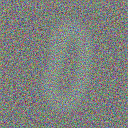

σ=0.1000, c_skip=0.9615, c_out=0.0981


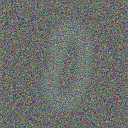

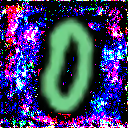

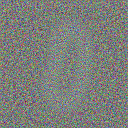

σ=0.0643, c_skip=0.9837, c_out=0.0638


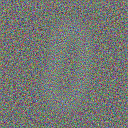

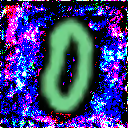

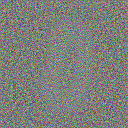

σ=0.0401, c_skip=0.9936, c_out=0.0400


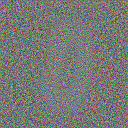

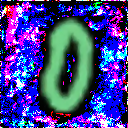

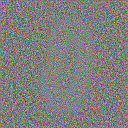

σ=0.0242, c_skip=0.9977, c_out=0.0242


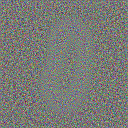

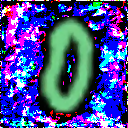

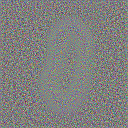

σ=0.0140, c_skip=0.9992, c_out=0.0140


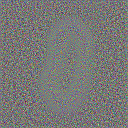

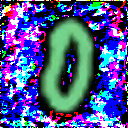

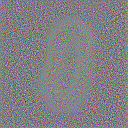

σ=0.0078, c_skip=0.9998, c_out=0.0078


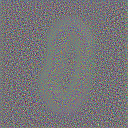

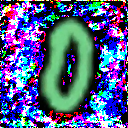

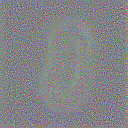

σ=0.0041, c_skip=0.9999, c_out=0.0041


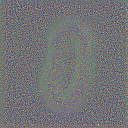

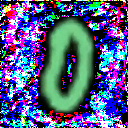

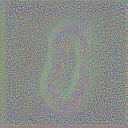

σ=0.0020, c_skip=1.0000, c_out=0.0020


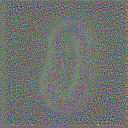

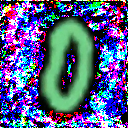

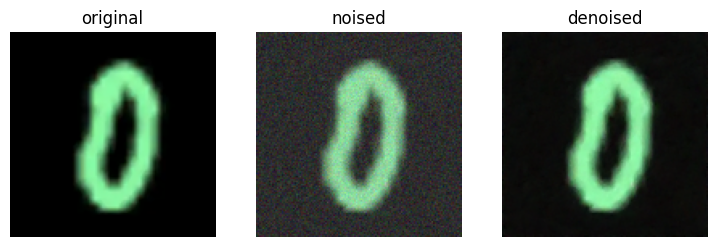

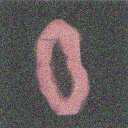

σ=1.0000, c_skip=0.2000, c_out=0.4472


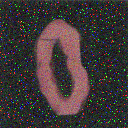

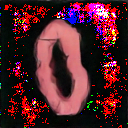

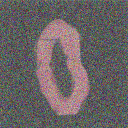

σ=0.5408, c_skip=0.4608, c_out=0.3671


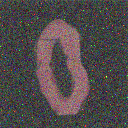

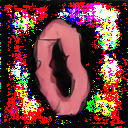

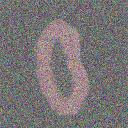

σ=0.2757, c_skip=0.7669, c_out=0.2414


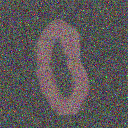

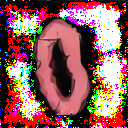

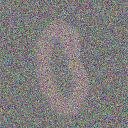

σ=0.1308, c_skip=0.9360, c_out=0.1265


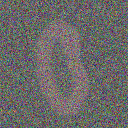

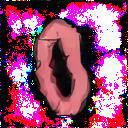

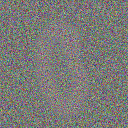

σ=0.0568, c_skip=0.9873, c_out=0.0564


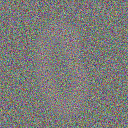

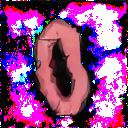

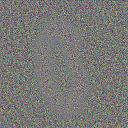

σ=0.0220, c_skip=0.9981, c_out=0.0220


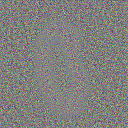

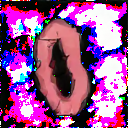

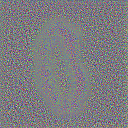

σ=0.0073, c_skip=0.9998, c_out=0.0073


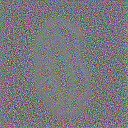

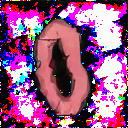

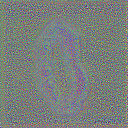

σ=0.0020, c_skip=1.0000, c_out=0.0020


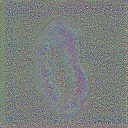

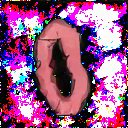

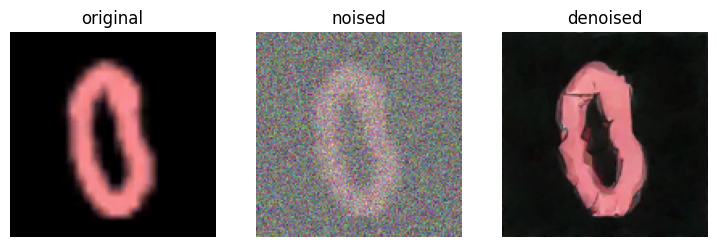

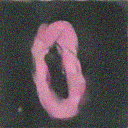

σ=2.0000, c_skip=0.0588, c_out=0.4851


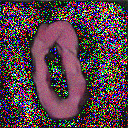

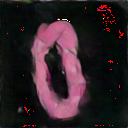

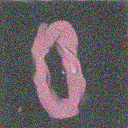

σ=1.0367, c_skip=0.1887, c_out=0.4504


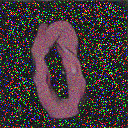

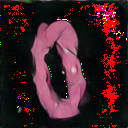

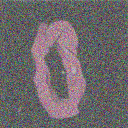

σ=0.5019, c_skip=0.4981, c_out=0.3542


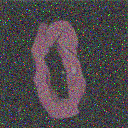

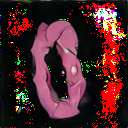

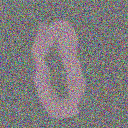

σ=0.2235, c_skip=0.8335, c_out=0.2040


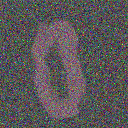

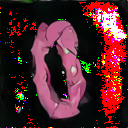

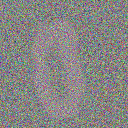

σ=0.0895, c_skip=0.9690, c_out=0.0881


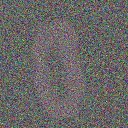

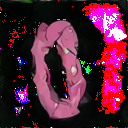

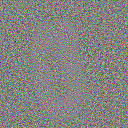

σ=0.0312, c_skip=0.9961, c_out=0.0312


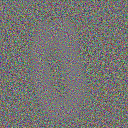

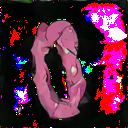

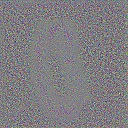

σ=0.0090, c_skip=0.9997, c_out=0.0090


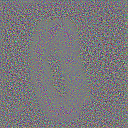

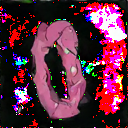

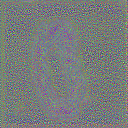

σ=0.0020, c_skip=1.0000, c_out=0.0020


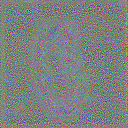

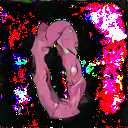

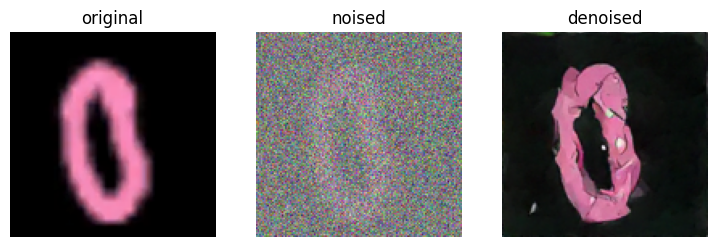

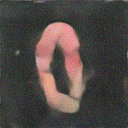

σ=3.0000, c_skip=0.0270, c_out=0.4932


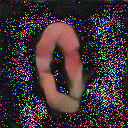

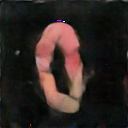

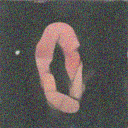

σ=1.5195, c_skip=0.0977, c_out=0.4749


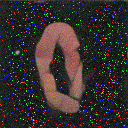

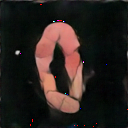

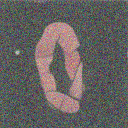

σ=0.7153, c_skip=0.3283, c_out=0.4098


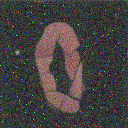

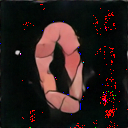

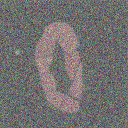

σ=0.3074, c_skip=0.7257, c_out=0.2619


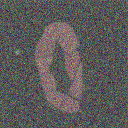

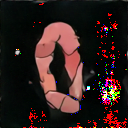

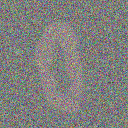

σ=0.1176, c_skip=0.9476, c_out=0.1145


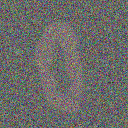

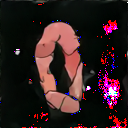

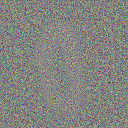

σ=0.0386, c_skip=0.9941, c_out=0.0385


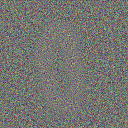

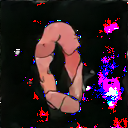

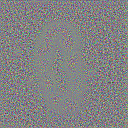

σ=0.0103, c_skip=0.9996, c_out=0.0103


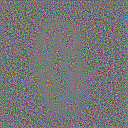

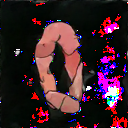

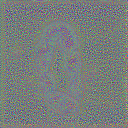

σ=0.0020, c_skip=1.0000, c_out=0.0020


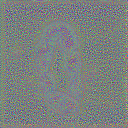

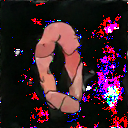

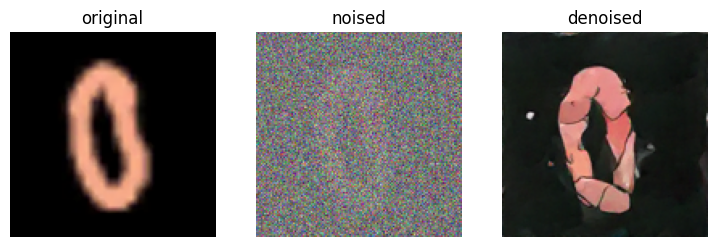

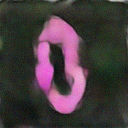

σ=5.0000, c_skip=0.0099, c_out=0.4975


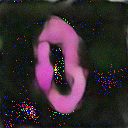

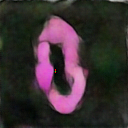

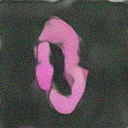

σ=2.4642, c_skip=0.0395, c_out=0.4900


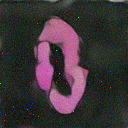

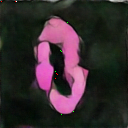

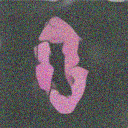

σ=1.1215, c_skip=0.1658, c_out=0.4567


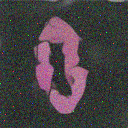

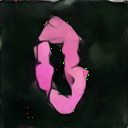

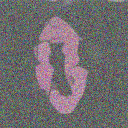

σ=0.4619, c_skip=0.5396, c_out=0.3393


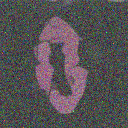

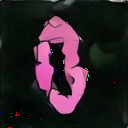

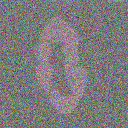

σ=0.1672, c_skip=0.8994, c_out=0.1586


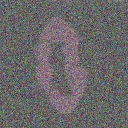

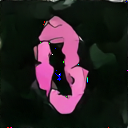

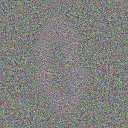

σ=0.0509, c_skip=0.9897, c_out=0.0507


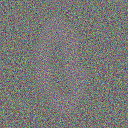

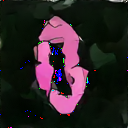

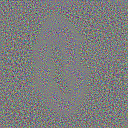

σ=0.0121, c_skip=0.9994, c_out=0.0121


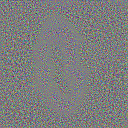

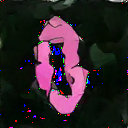

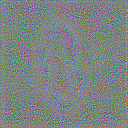

σ=0.0020, c_skip=1.0000, c_out=0.0020


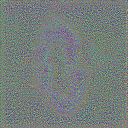

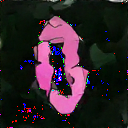

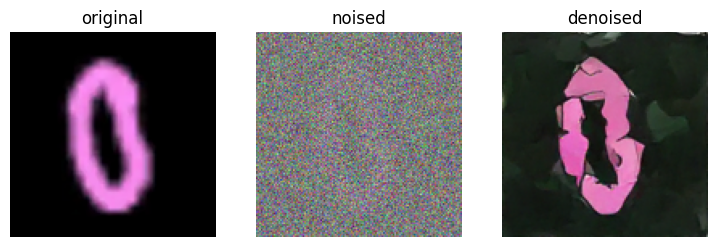

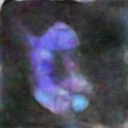

σ=10.0000, c_skip=0.0025, c_out=0.4994


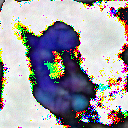

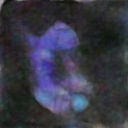

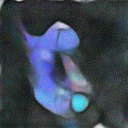

σ=4.7628, c_skip=0.0109, c_out=0.4973


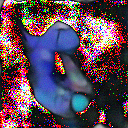

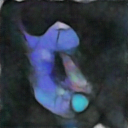

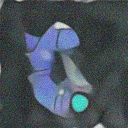

σ=2.0773, c_skip=0.0548, c_out=0.4861


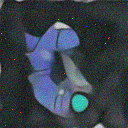

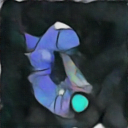

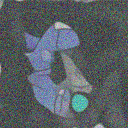

σ=0.8102, c_skip=0.2758, c_out=0.4255


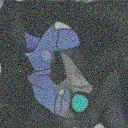

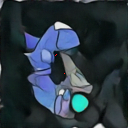

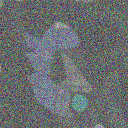

σ=0.2729, c_skip=0.7705, c_out=0.2395


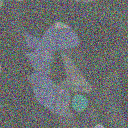

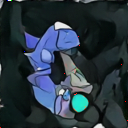

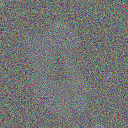

σ=0.0752, c_skip=0.9779, c_out=0.0744


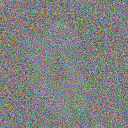

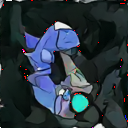

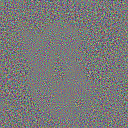

σ=0.0155, c_skip=0.9990, c_out=0.0155


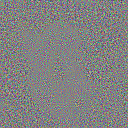

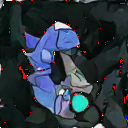

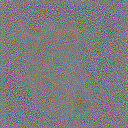

σ=0.0020, c_skip=1.0000, c_out=0.0020


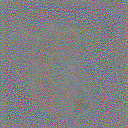

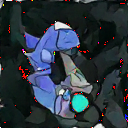

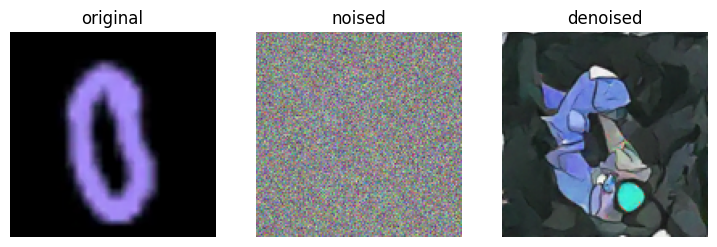

In [24]:

import random
from elucidated_diffusion.dataset_helpers import AugmentedHRLRDataset
from elucidated_diffusion.checkpoint_helper import load_checkpoint, save_checkpoint, show_model_info

def get_dataset_and_loader(dataset_name,img_size):
    ds = AugmentedHRLRDataset(f"../data/256x256/{dataset_name}",img_size,img_size)
    batch_size = 128*128 // img_size // img_size *2 *3
    if batch_size == 0:
        batch_size = 1
    dl = DataLoader(ds, batch_size=batch_size, shuffle=True, num_workers=0)
    return ds, dl
dataset_name='mnist_scaled'
img_size=128
test_dataset,test_loader = get_dataset_and_loader(dataset_name,img_size)
idx = random.randint(0,len(test_dataset))


def get_trained_model(mn,img_size,dataset_name):
    m=get_model(mn,img_size)
    m.to(device)
    model_name = m.__class__.__name__
    checkpoint_path = f'../checkpoints/{dataset_name}_{img_size}_{model_name}.pth'
    model_edm,optimizer_edm,metadata = load_checkpoint(model=m, optimizer=None, path=checkpoint_path)
    model_edm.eval()
    return model_edm


def try_noise_levels(idx,model_edm, noise_sigma=1,blur_sigma=0):
    original = test_dataset[idx][0]
    total_sigma = (noise_sigma**2 + blur_sigma**2)**0.5
    noised = add_noise(original,noise_sigma)
    denoised = denoise(noised,model_edm,num_steps=8,start_sigma=total_sigma)
    title = f"noise_sigma={noise_sigma},blur_sigma={blur_sigma}"
    show_results(original,noised,denoised)
model = get_trained_model('claude_semantic_coordinator',128,'pokemon')
#model = get_trained_model('hybrid_cascaded_vit',128,'pokemon')
#model = get_trained_model('claude_skip_attention',128,'pokemon')

try_noise_levels(idx,model,0.1)
try_noise_levels(idx,model,1)
try_noise_levels(idx,model,2)
try_noise_levels(idx,model,3)
try_noise_levels(idx,model,5)
try_noise_levels(idx,model,10)